# **Imports**

In [1]:

from earthscape.constants import DATASET_DIR, SG_COLORS, SRC_URLS, SG_MAPPING
from earthscape.utils import set_seed, plot_multi_terrain_features, calculate_dataset_stats
from earthscape.data.gis import gis_to_image, clip_gis_to_boundary, create_aoi_polygon
from earthscape.data.downloads import download_zip
from earthscape.data.kyfromabove import download_data_tiles, mosaic_image_tiles, ky_index_tiles
from earthscape.data.images import image_to_reference_grid, combine_aligned_images, resample_image, filter_image
from earthscape.data.qcqa import check_image_alignment, validate_patches, create_metadata
from earthscape.data.patches import create_image_patches, extract_patch, calculate_patch_areas, calculate_one_hots

import os
import glob
import shutil
import re
import numpy as np
import pandas as pd
import geopandas as gpd
import whitebox
import rasterio
from shapely.geometry import box
from rasterio.plot import show

import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.colors import ListedColormap

In [2]:
# dataframe display options...
pd.options.display.float_format = '{:.2f}'.format     # show decimal format (not scientific notation)
pd.set_option('display.max_columns', None)            # display all columns

# **Setup**

In [3]:
#######################
# Initial Setup
#######################

##### set seed
set_seed(111)


##### area names & download URL
area_name_formal = 'Sonora'
area_name_abbr = 'sonora'
area_src_url = r'https://ngmdb.usgs.gov/ngm-bin/gems_download.pl?id=1630&pid=111983'


##### area data directory setup...
output_dir = f"{DATASET_DIR}/{area_name_formal.replace(' ', '').lower()}"
if not os.path.isdir(output_dir):
    os.makedirs(output_dir)


##### resolution of all images in spatial units of coordinate reference system
output_resolution = 5    # 5 feet used here to match native DEM of kentucky dataset


##### Surficial Geologic Map parameters
# map units to re-assign labels into the label space of af1, Qal, Qaf, Qat, Qc, Qca, Qr
# if map already within the label space, map_units = None
map_units = {'Qapc': 'Qat', 'Qls': 'Qc'}


# buffer distance in native CRS spatial units (feet for this project)
# NOTE: buffer distance should be enough to mitigate edge effects for terrain feature calculations (i.e., calculations using window/neighborhood)
buffer_distance = 1000


##### Multi-scale terrain feature parameters
# multi-scale resolutions/kernels for DEM and terrain feature derivatives...
# list of resolution(s) to downsample DEM & calculate S, PrC, PlC; in native spatial units
# NOTE: S, PrC, PlC - use 5x5 kernel window & multi-scale DEM resolutions.
downsample_resolutions = [10, 20, 50, 100, 200]

# list of kernel windows to use for EP and SDS; in square pizel window sizes
# NOTE: EP and SDS are window statistics and use variable sized kernels for multi-scales
kernel_windows = [5, 11, 21, 51, 101, 201]

# NOTE: multi resolutions & kernels chosen so that their effective spatial footprint is approximately equal

# sigma value for gaussian filter applied to downsampled DEMs & calculated terrain features
sigma = 2

# bounding box coordinates for plotting multi-scale terrain features (left, bottom, right, top)
# choose & customize for each new map
bounding_box = (4870000, 3725000, 4880000, 3735000)

##### Patch parameters...
# define patch size (in pixels)
patch_size = 256

# proportion of patch overlap
overlap = 0.5


# **Surficial Geology**

***OVERVIEW***
* Sonora's surficial geology is shaped by three primary geological processes: in-situ weathering of bedrock, gravity-driven sediment deposition, and fluvial sediment transportation and deposition. These processes result in eight distinct geologic map units, each defined by unique textural, compositional, and topographic characteristics.


    1. **Artificial fill (af1).** Man-made deposits of soil, sand, gravel, concrete, asphalt, or other materials used to alter the landscape, typically associated with construction activities such as road building, land leveling, or embankment creation.

    2. **Alluvium (Qal).** Unconsolidated sediments composed of varying mixtures of silt, sand, clay, and gravel deposited by rivers and streams. These materials are typically found in riverbeds, floodplains, and deltas, representing active or recent fluvial processes.
    
    3. **Alluvial fans (Qaf).** Cone-shaped deposits of alluvium formed where high-gradient streams emerge from mountainous areas onto flatter plains, causing a decrease in flow velocity and subsequent sediment deposition. They are characterized by a fan-like spread of sediments due to the lateral shifting of stream channels over time. Considered as child unit of alluvium.

    4. **Allvual terraces (Qat).** Step-like landforms along river valleys composed of alluvium, representing former floodplain levels that have been dissected due to river incision or changes in base level. Considered as a child unit of alluvium.

    5. **Paleochannel alluvium (Qapc).** Considered as a child of alluvium or terrace deposits, and represent unconsolidated alluvial sediments residing in conspicuous, inactive, relict river channel landforms, known as paleochannels.   

    6. **Colluvium (Qc).** Unconsolidated, gravity-driven deposits forming a thin veneer of actively moving soil and rock fragments on steep slopes greater than 12 degrees. This material moves downslope through processes such as creep, sheetwash, and small-scale mass wasting.

    7. **Landslide deposits (Qls).** Chaotic accumulations of rock, soil, and debris formed from the rapid downslope movement of materials under the influence of gravity. These deposits are indicative of mass wasting events and can vary greatly in size, composition, and internal structure depending on the nature of the landslide. Considered as a child unit of colluvium.
    
    8. **Residuum (Qr).** Weathered rock material that remains in situ above its parent bedrock, resulting from prolonged chemical and physical weathering processes, and often forming the basis for soil development directly over the source rock.


***PURPOSE***
* The surficial geologic map is downloaded as an ESRI file geodatabase that includes multiple tables. The MapUnitsPolys feature class in the geodatabase consists of polygons representing the aerial extent of these surficial geologic map units in the map area, which serve as labeled targets. 


***SPECIAL NOTE***
* Map units Qls and Qapc are not in the Warren County area dataset, which is used for training and validation. To mitigate potential errors with these unseen map units, they will be re-assigned to a parent lithology. This is not problematic nor biased because surficial geologic map units are hierarchical in nature. In this particular case, Qls is rare, relatively small, and can be considered a child of colluvium. Qapc is also rare, relatively small, and can be considered a child of alluvium. Qls and Qapc will be re-assigned to it's neighbors value; in the case of multiple touching neighbors, the neighbor sharing the longest border will be used. 


***REFERENCE***
* Massey, M.A., Bottoms, A.E., Hammond, M.L., III, Morris, Emily, and McHugh, Michelle, 2021, Surficial geologic map of the Sonora 7.5-minute quadrangle, central Kentucky. Kentucky Geological Survey, Contract Report Series 13, Issue 43, 1:24000 scale. https://ngmdb.usgs.gov/Prodesc/proddesc_111983.htm

## *Surficial Geologic Map Polygons*

In [4]:
###########################
# Download Map Geodatabase
###########################

##### download zip & extract contents
download_zip(area_src_url, output_dir)

In [5]:
###############################################
# Save Map as GeoJSON & Create AOI Boundaries
###############################################

# paths for processing...
gdb_path = glob.glob(f"{output_dir}/**/*.gdb", recursive=True)[0]             # path to gdb
map_layer = 'MapUnitPolys'                                                    # gdb layer name containing polygons
geo_path = f"{output_dir}/mask.geojson"                                       # path for geologic map GeoJSON output
aoi_path = f"{output_dir}/boundary.geojson"                                   # path for aoi boundary output
aoi_buffer_path = f"{output_dir}/boundary_buffer{buffer_distance}.geojson"    # path for buffered aoi output


##### read gdb layer
gdf = gpd.read_file(gdb_path, layer=map_layer)


##### re-assign map units (if necessary)
if not map_units is None:
    for key, val in map_units.items():
        gdf.loc[gdf['Symbol']==key, 'Symbol'] = val


##### repair some broken geometries & save map GeoJSON
gdf['geometry'] = gdf['geometry'].buffer(0)
if gdf.is_valid.all():
    gdf.to_file(geo_path, driver='GeoJSON')


##### create AOI boundary polygon
create_aoi_polygon(geo_path, aoi_path)


##### create buffered AOI boundary polygon
gdf_aoi = gpd.read_file(aoi_path)
gdf_aoi['geometry'] = gdf_aoi['geometry'].buffer(buffer_distance)     # buffer (expand) boundary by specified amount
gdf_aoi.to_file(aoi_buffer_path, driver='GeoJSON')                    # write new buffered dataset boundary to GeoJSON

/opt/miniconda3/envs/earthscape/lib/python3.13/site-packages/pyogrio/raw.py:198: RuntimeWarning: organizePolygons() received a polygon with more than 100 parts. The processing may be really slow.  You can skip the processing by setting METHOD=SKIP, or only make it analyze counter-clock wise parts by setting METHOD=ONLY_CCW if you can assume that the outline of holes is counter-clock wise defined
  return ogr_read(


In [6]:
##############################
# Convert GeoJSON to GeoTIFF
##############################

# attribute to use as category in raster (if none, then output image is binary)
attribute = 'Symbol'

# path to output image (and JSON metadata)
output_path = geo_path.replace('.geojson', '.tif')


##### custom function to convert GeoJSON to GeoTIFF with JSON metadata
gis_to_image(input_path=geo_path, output_path=output_path, output_resolution=output_resolution, multiclass_col=attribute)

## *Visualize Target & Boundaries*

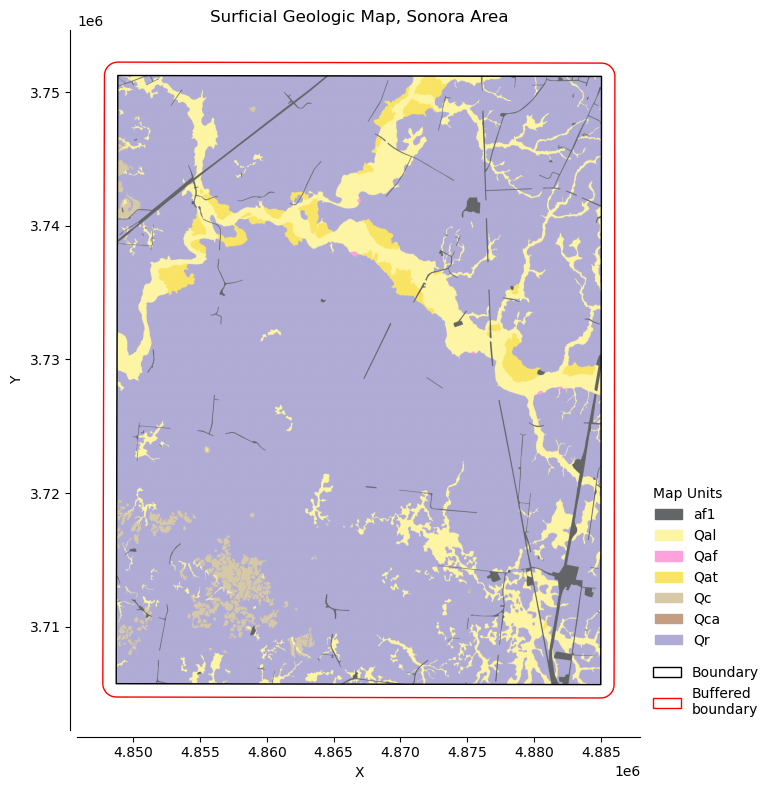

In [ ]:
###############################################
# Visualize Target GeoTIFF & Boundary GeoJSONs
###############################################

# path to GeoTIFF
geo_path = f"{output_dir}/mask.tif"

# path to dataset boundary
boundary_path = f"{output_dir}/boundary.geojson"

# path to buffered dataset boundary
buffered_path = glob.glob(f"{output_dir}/*buffer*.geojson")[0]


##### visualize GeoTIFF with custom colormap & dataset boundaries
fig, ax = plt.subplots(figsize=(8,8))
cmap = ListedColormap(SG_COLORS.values())

# plot map...
with rasterio.open(geo_path) as src:
    show(src, ax=ax, cmap=cmap)

# custom colors and legend for map...
handles = [Patch(color=v, label=k) for k,v in SG_COLORS.items()]
legend1 = plt.legend(handles=handles, bbox_to_anchor=(1, 0.1), loc='lower left', frameon=False, title='Map Units')

# plot dataset boundary...
boundary = gpd.read_file(boundary_path)
boundary.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=1)
handles2 = [Patch(facecolor='none', edgecolor='k', linewidth=1, label='Boundary')]

# plot buffered boundary...
buffered = gpd.read_file(buffered_path)
buffered.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=1)
handles2.append(Patch(facecolor='none', edgecolor='red', linewidth=1, label='Buffered\nboundary'))

# add legends...
legend2 = plt.legend(handles=handles2, bbox_to_anchor=(1, 0), loc='lower left', frameon=False)
ax.add_artist(legend1)

# customize plot...
ax.set_title(f"Surficial Geologic Map, {area_name_formal} Area")
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_position(('outward', 5))
ax.spines['left'].set_position(('outward', 5))

plt.tight_layout()
plt.show()

In [8]:
############################
# Remove Target Geodatabase
############################

# path to subdirectory
subdir_path = [x[0] for x in os.walk(output_dir)][1]

# delete geodatabase
if os.path.isdir(subdir_path):
    shutil.rmtree(subdir_path)

# **KyFromAbove Tile Index**

***OVERVIEW***
* The KyFromAbove 5K tile index is available as a geodatabase containing three polygon feature classes for accessing digital elevation models (DEMs), aerial imagery, and LiDAR point cloud datasets. These feature classes represent grids of individual tiles, each corresponding to a specific area. The tiles can be downloaded as GeoTIFF images, with each tile featuring various attributes, including download URLs. More information can be found at the KyFromAbove website - https://kyfromabove.ky.gov/

***PURPOSE***
* The tile index is essential for identifying and accessing the specific DEM and aerial imagery GeoTIFF images that correspond to the area of interest covered by the target map datasets. Although the tile index itself is not directly used as a feature, it facilitates the retrieval of the necessary data for further analysis.

In [9]:
################################################
# Download & Save Index Tile Layers as GeoJSONs
################################################

# path to buffered AOI boundary
buffered_path = glob.glob(f"{output_dir}/*buffer*.geojson")[0]


##### get DEM and aerial index tiles for AOI & save as GeoJSON
dem_index = ky_index_tiles(buffered_path, 'Phase1_AWS_url', SRC_URLS['kyfromabove_dem_index'], 'Tile_Name')
aerial_index = ky_index_tiles(buffered_path, 'Phase1_url', SRC_URLS['kyfromabove_aerial_index'], 'TileName')


##### reproject to common CRS & save
dem_index = dem_index.to_crs('EPSG:3089')
aerial_index = aerial_index.to_crs('EPSG:3089')

dem_index.to_file(f"{output_dir}/dem_index.geojson", driver='GeoJSON')
aerial_index.to_file(f"{output_dir}/aerial_index.geojson", driver='GeoJSON')

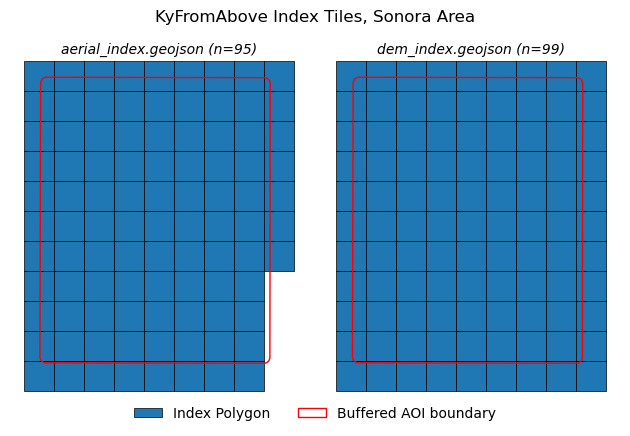

In [10]:
####################################################
# Visualize Index Tiles & Buffered Dataset Boundary
####################################################

# list of paths to index tiles
index_paths = glob.glob(f"{output_dir}/*index*.geojson")

# path to buffered dataset boundary
buffered_path = glob.glob(f"{output_dir}/*buffer*.geojson")[0]


##### read GeoJSONs as geodataframes & visualize coverage
fig, ax = plt.subplots(ncols=2)
plt.subplots_adjust(wspace=0.05)

buffered = gpd.read_file(buffered_path)

# plot tile index and buffered boundary for reference...
for idx, path in enumerate(index_paths):
    index = gpd.read_file(path)
    name = os.path.basename(path)
    name = name + f" (n={len(index)})"
    index.plot(ax=ax[idx], edgecolor='k', linewidth=0.5)
    buffered.plot(ax=ax[idx], facecolor='none', edgecolor='red', linewidth=1)
    ax[idx].set_title(name, style='italic', fontsize=10, y=0.95)
    ax[idx].set_axis_off()

# customize...
buffered_patch = Patch(facecolor='none', edgecolor='red', linewidth=1, label='Buffered AOI boundary')
index_patch = Patch(edgecolor='k', linewidth=0.5, label='Index Polygon')
handles = [index_patch, buffered_patch]
plt.tight_layout()
plt.suptitle(f"KyFromAbove Index Tiles, {area_name_formal} Area", y=0.95)
plt.figlegend(handles=handles, loc='upper center', bbox_to_anchor=(0.5,0.15), frameon=False, ncols=2)

plt.show()

# **Digital Elevation Model (DEM)**

***OVERVIEW***
* The Kentucky statewide digital elevation model (DEM) is generated from airborne LiDAR data collected since 2010. The data collection was divided into phases: Phase 1 produced a DEM with a 5-foot resolution, while Phase 2 resulted in a more detailed 2-foot resolution DEM. These datasets are publicly accessible in small tiles available for download in either .img (with associated metadata files) or .tif (GeoTIFF) formats. This project will utilize the Phase 1 5 foot DEM.

***PURPOSE***
* The DEM serves as a fundamental base layer for interpreting and delineating surficial geologic map units in this project. The DEM also enables the derivation of multiple terrain features and indices, which provide additional insights and are calculated in a subsequent section.

In [12]:
###############################################
# Download DEM GeoTIFF tiles for Map Area
###############################################

# path to DEM tile index GeoJSON
index_path = f"{output_dir}/dem_index.geojson"

# field containing unique tile id for file naming
id_field = 'tile'

# field containing GeoTIFF download url
url_field = 'url'

# output directory to save downloaded tiles
dem_dir = f"{output_dir}/dem_tiles"
if not os.path.isdir(dem_dir):
    os.makedirs(dem_dir)


###### call custom function to download tiles
download_data_tiles(index_path, id_field, url_field, dem_dir)

In [13]:
###########################################
# Mosaic DEM Tiles into Single DEM GeoTIFF
###########################################

# list of DEM tile GeoTIFFs
dem_tile_paths = glob.glob(f"{dem_dir}/*.tif")

# path for output DEM mosaic
dem_path = f"{output_dir}/dem.tif"


##### mosaic DEM tiles to single DEM
# NOTE: this produces a single DEM of the tiles that completely cover the target area + the expanded (buffered) boundary needed for terrain feature calculations. The result is very 'blocky', but will be refined at end.
mosaic_image_tiles(dem_tile_paths, dem_path, band_number=1)

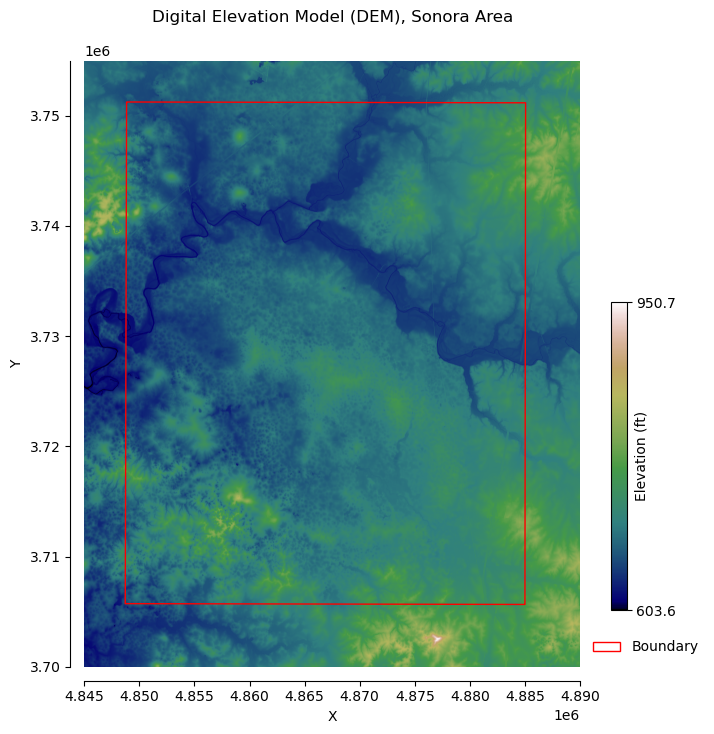

In [14]:
#######################
# Visualize DEM Mosaic
#######################

# path to buffered dem mosaic
dem_path = f"{output_dir}/dem.tif"

# path to target boundary (not buffered)
boundary_path = f"{output_dir}/boundary.geojson"


##### plot dem
fig, ax = plt.subplots(figsize=(8,8))

# dem
with rasterio.open(dem_path) as dem:
    
    # get dem data
    data = dem.read(1, masked=True)
    min_val = np.min(data)
    max_val = np.max(data)
    bounds = dem.bounds

    # plot dem with imshow to get colorbar for figure (not shown)
    dem_hidden = ax.imshow(data, cmap='gist_earth', interpolation='bicubic')

    # plot dem with rasterio.plot.show
    show(dem, ax=ax, cmap='gist_earth')

# plot DEM colorbar
cbar = fig.colorbar(dem_hidden, ticks=[min_val, max_val], shrink=0.5, anchor=(0, 0.2))
cbar.set_label('Elevation (ft)', labelpad=-30)

# plot dataset boundary & patch for legend...
boundary = gpd.read_file(boundary_path)
boundary.plot(ax=ax, facecolor='none', edgecolor='red')
boundary_patch = Patch(facecolor='none', edgecolor='red', label='Boundary')
ax.legend(handles=[boundary_patch], loc='lower left', bbox_to_anchor=(1, 0), frameon=False)

# customize...
ax.set_xlim(bounds.left, bounds.right)
ax.set_ylim(bounds.bottom, bounds.top)
ax.set_title(f"Digital Elevation Model (DEM), {area_name_formal} Area", y=1.05)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_position(('outward', 10))
ax.spines['left'].set_position(('outward', 10))

plt.show()

In [15]:
###################
# Delete DEM Tiles
###################

##### delete dem_tiles folder and all contents
if os.path.isdir(dem_dir):
    shutil.rmtree(dem_dir)

# **Aerial Imagery**

***OVERVIEW***
* Aerial imagery has been collected alongside LiDAR data as part of the KyFromAbove program, providing high-resolution coverage across Kentucky. The imagery is available with resolutions ranging from 1 foot to 3 inches, with a standard statewide resolution of 6 inches. Although the program captures true color imagery (RGB) across the state, some areas also include near-infrared (NIR) as a fourth band. These four-band images are accessible for download, offering detailed visual information about the landscape.

***PURPOSE***
* The four-band aerial imagery (RGB + NIR) plays a specific role in predicting certain surficial geologic map units. This imagery is particularly useful for identifying artificial fill, as man-made structures and disturbed land are easily distinguishable from natural landscapes. Additionally, the imagery may help in recognizing areas of alluvium or stream channels, especially where vegetation patterns (visible through the NIR band) can indicate the presence of water or recent sediment deposition. While the imagery may not be as effective for delineating all surficial map units, its value lies in enhancing the identification of human-altered landscapes and specific hydrological features.

* There may be a temporal discrepancy between the DEM and aerial imagery datasets, as they could have been captured at different times. This discrepancy can introduce challenges in analysis, particularly in areas where topographic changes have occurred between the collection dates, potentially affecting the consistency and accuracy of the derived features.

In [16]:
##################################################
# Download Aerial Imagery Tiles for Map Area
##################################################

# path to aerial imagery tile index GeoJSON
index_path = f"{output_dir}/aerial_index.geojson"

# field containing unique tile id
id_field = 'tile'

# field containing TIFF download url
# NOTE: this field is not the same for all areas, and must be checked manually
url_field = 'url'

# output directory to save downloaded tiles
aerial_dir = f"{output_dir}/aerial_tiles"
if not os.path.isdir(aerial_dir):
    os.makedirs(aerial_dir)


##### call custom function to download tiles
download_data_tiles(index_path, id_field, url_field, aerial_dir)

In [17]:
########################################
# Mosaic Aerial Tiles to Single GeoTIFF
########################################

# list of paths of aerial image tiles
aerial_tile_paths = glob.glob(f"{output_dir}/aerial_tiles/*.tif")

# path to image to use as alignment reference
reference_path = f"{output_dir}/mask.tif"


##### iterate through bands, mosaic tiles to single 1-band GeoTIFF, & align with reference image
band_names = ['r', 'g', 'b', 'nir']
for i, band in enumerate(band_names, start=1):
    aerial_path = f"{output_dir}/aerial{band}.tif"
    mosaic_image_tiles(aerial_tile_paths, aerial_path, band_number=i, resample=(output_resolution, output_resolution))
    image_to_reference_grid(aerial_path, reference_path)

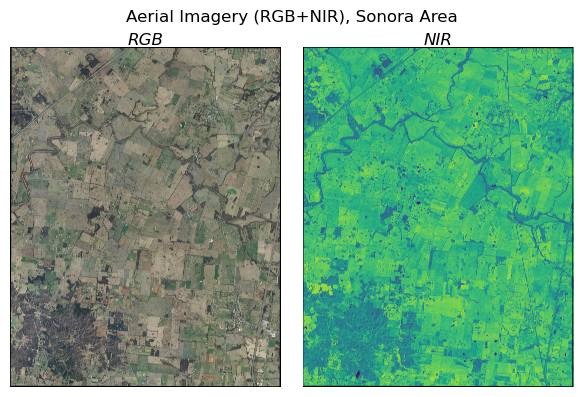

In [18]:
##############################
# Visualize Aerial Imagery
##############################

# paths to aerial images...
rgb_paths = [f"{output_dir}/aerialr.tif", f"{output_dir}/aerialg.tif", f"{output_dir}/aerialb.tif"]
nir_path = f"{output_dir}/aerialnir.tif"

# path to target boundary (not buffered)
boundary_path = f"{output_dir}/boundary.geojson"

##### plot imagery...
fig, ax = plt.subplots(ncols=2, figsize=(6,4))

# RGB...
rgb_image = []
for path in rgb_paths:
    with rasterio.open(path) as src:
        data = src.read(1)
        bounds = src.bounds
        transform = src.transform
        rgb_image.append(data)
rgb = np.stack(rgb_image, axis=0)
rgb = rgb.astype(np.float32) / 255.0
show(rgb, ax=ax[0], transform=transform)
ax[0].set_axis_off()
ax[0].set_title('RGB', style='italic', y=0.98)

# NIR...
with rasterio.open(nir_path) as src:
    show(src, ax=ax[1], cmap='viridis')
ax[1].set_axis_off()
ax[1].set_title('NIR', style='italic', y=0.98)

# boundary...
boundary = gpd.read_file(boundary_path)
for axes in ax:
    boundary.plot(ax=axes, facecolor='none', edgecolor='k')
    axes.set_xlim(bounds.left, bounds.right)
    axes.set_ylim(bounds.bottom, bounds.top)

plt.suptitle(f"Aerial Imagery (RGB+NIR), {area_name_formal} Area")
plt.tight_layout()
plt.show()

In [ ]:
###############
# Delete Tiles
###############

##### delete aerial_tiles folder and all contents
if os.path.isdir(aerial_dir):
    shutil.rmtree(aerial_dir)

# **Hydrography**

**OVERVIEW**
* The NHDPlus High Resolution (HR) dataset is a comprehensive geospatial resource that maps the flow of water across the United States, integrating stream networks, water bodies, and landscape features. Built using the National Hydrography Dataset (NHD) at a scale of 1:24,000 or finer, along with high-resolution elevation data from the 3D Elevation Program and the Watershed Boundary Dataset, NHDPlus HR provides detailed and accurate representations of hydrography. This dataset is crucial for hydrological analysis, environmental modeling, and understanding the interaction between water and the landscape. More information can be found in the USGS publication - https://pubs.usgs.gov/publication/ofr20191096.

**PURPOSE**
* The NHDPlus HR dataset includes two key features that will be integrated into this project:

    1. **NHDFlowline.** Stream centerlines represent the flow paths of rivers and streams, capturing the direction and connectivity of water flow across the landscape. These centerlines are essential for identifying and delineating areas of alluvium, as they highlight where water-driven sediment transport and deposition are most likely to occur.

    2. **NHDWaterbody.** The waterbody polygons define the spatial extent of lakes, ponds, reservoirs, and other bodies of standing water. These features are useful for identifying low-lying areas where sediment may accumulate, as well as for recognizing artificial fill associated with water control structures like dams and levees.

In [20]:
##############################
# Download NHDPlus HR Dataset
##############################

# directory to save hydrography
nhd_dir = f"{output_dir}/nhdplushr"
if not os.path.isdir(nhd_dir):
    os.makedirs(nhd_dir)


##### custom function to download zip, extract contents, and delete zip
download_zip(SRC_URLS['nhd'], nhd_dir)

In [21]:
####################################################################
# Clip to NHDFlowline & NHDWaterbody to Boundary & Save as GeoJSONs
####################################################################

# path to NHDPlus HR geodatabase
gdb_path = glob.glob(f"{nhd_dir}/*.gdb")[0]

# path to buffered target boundary GeoJSON
boundary_path = glob.glob(f"{output_dir}/*buffer*.geojson")[0]


##### clip NHDFlowline and NHDWaterbody layers to boundary
for layer in ['NHDFlowline', 'NHDWaterbody']:
    output_path = f"{output_dir}/{layer}.geojson"
    output_path = output_path.lower()
    if not os.path.isfile(output_path):
        clip_gis_to_boundary(gdb_path, boundary_path, output_path, layer)

/opt/miniconda3/envs/earthscape/lib/python3.13/site-packages/pyogrio/raw.py:198: UserWarning: Measured (M) geometry types are not supported. Original type 'Measured 3D MultiLineString' is converted to 'MultiLineString Z'
  return ogr_read(


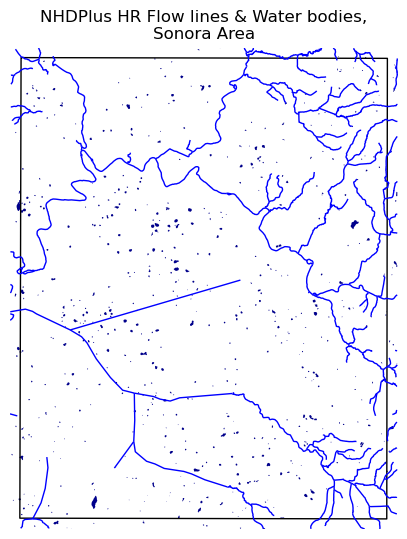

In [22]:
##########################################
# Visualize Flowline & Waterbody GeoJSONs
##########################################

# path to flowline GeoJSON
flowline_path = f"{output_dir}/nhdflowline.geojson"

# path to waterbodies GeoJSON
waterbody_path = f"{output_dir}/nhdwaterbody.geojson"

# path to target dataset boundary
boundary_path = f"{output_dir}/boundary.geojson"


##### plot GeoJSONs
fig, ax = plt.subplots(figsize=(5,7))

# flowlines...
gdf_flowline = gpd.read_file(flowline_path)
gdf_flowline.plot(ax=ax, color='blue', linewidth=1, label='Flow lines')
bounds = gdf_flowline.total_bounds

# water bodies...
gdf_waterbody = gpd.read_file(waterbody_path)
gdf_waterbody.plot(ax=ax, color='darkblue', label='Water bodies')

# dataset boundary...
gdf_boundary = gpd.read_file(boundary_path)
gdf_boundary.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=1)

ax.set_axis_off()
ax.set_xlim(bounds[0], bounds[2])
ax.set_ylim(bounds[1], bounds[3])
ax.set_title(f"NHDPlus HR Flow lines & Water bodies,\n{area_name_formal} Area")

plt.show()

In [23]:
######################################################
# Combine Flowlines & Waterbodies Into Single GeoTIFF
######################################################

# list of paths to flowline and waterbody GeoJSONs
# NOTE: in this order, waterbody will be prioritized if features overlap
input_paths = [f"{output_dir}/nhdflowline.geojson", 
               f"{output_dir}/nhdwaterbody.geojson"]

# path to reference image (using labeled target dataset)
reference_path = f"{output_dir}/mask.tif"

# path for output GeoTIFF
nhd_path = f"{output_dir}/nhd.tif"


##### rasterize each GeoJSON, align to target grid, combine images to single GeoTIFF
temp_paths = []
for path in input_paths:
    tmp_path = path.replace('.geojson', '.tif')
    temp_paths.append(tmp_path)
    gis_to_image(path, tmp_path, 5, multiclass_col=None)
    image_to_reference_grid(tmp_path, reference_path, output_dtype=np.float32)

combine_aligned_images(temp_paths, nhd_path, mode="binary", class_values=None)


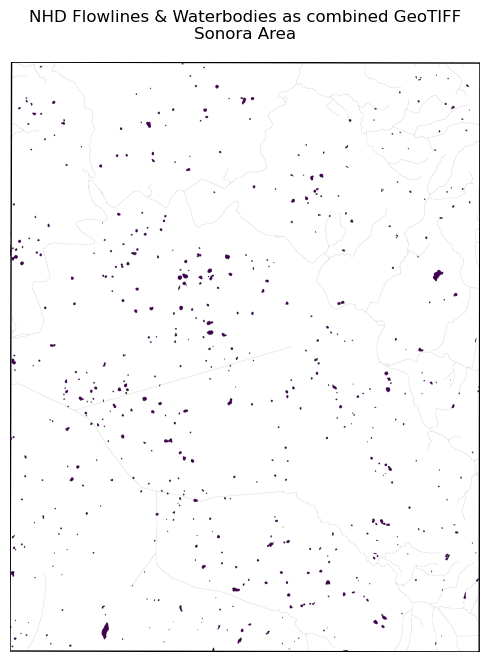

In [24]:
###########################
# Visualize Single GeoTIFF
###########################

# path to single GeoTIFF
nhd_path = f"{output_dir}/nhd.tif"

# path to dataset boundary GeoJSON
boundary_path = f"{output_dir}/boundary.geojson"


##### plot GeoTIFF and AOI boundary
fig, ax = plt.subplots(figsize=(5,7))

# combined nhd geotiff...
with rasterio.open(nhd_path) as src:
    show(src, ax=ax, cmap='viridis', zorder=2)

# dataset boundary...
boundary = gpd.read_file(boundary_path)
boundary.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=1, zorder=1)

ax.set_axis_off()
ax.set_title(f"NHD Flowlines & Waterbodies as combined GeoTIFF\n{area_name_formal} Area")
plt.tight_layout()
plt.show()

In [25]:
#########################
# Delete NHD Data Folder
#########################

# path to nhd data folder (not GeoTIFF images)
nhd_dir = f"{output_dir}/nhdplushr"


##### remove nhdplushr folder and all contents (to save disk space)
if os.path.isdir(nhd_dir):
    shutil.rmtree(nhd_dir)


##### remove single feature binary GeoTIFF images
fl_path = f"{output_dir}/nhdflowline.tif"
if os.path.isfile(fl_path):
    os.remove(fl_path)

wb_path = f"{output_dir}/nhdwaterbody.tif"
if os.path.isfile(wb_path):
    os.remove(wb_path)

# **Roads & Railways**

**OVERVIEW**
* OpenStreetMap (OSM) is a collaborative mapping project that provides freely accessible and up-to-date geospatial data. OSM data is continuously updated by a global community of contributors, making it a valuable resource for mapping current human developments and infrastructure. More information can be found at the OSM website - https://www.openstreetmap.org/about

**PURPOSE**
* Two layers from the OSM dataset will be utilized for this project, including road (gis_osm_roads_free_1) and railway (gis_osm_railways_free_1) centerlines. These features should be useful for identifying areas of artificial fill or areas of manmade alteration to the landscape. These features highlight regions where construction activities, such as road building or railway construction, may have introduced man-made changes to the landscape, such as grading, cutting, or filling.

* Since OSM data is continually updated, features may represent more recent developments that are not reflected in the KyFromAbove DEM or imagery datasets. Although This temporal mismatch could introduce some uncertainty in areas where significant changes have occurred since the DEM or aerial imagery were captured. However, the OSM data can still provide valuable insights into human modifications of the landscape, which are important for predicting surficial geologic map units.

In [26]:
###############################################
# Download OpenStreetMaps Dataset for Kentucky
###############################################

# directory to save statewide osm dataset
osm_dir = f"{output_dir}/osm"
if not os.path.isdir(osm_dir):
    os.makedirs(osm_dir)


##### custom function to download zip, extract contents, and delete .zip
download_zip(SRC_URLS['osm'], osm_dir)

In [27]:
###########################################################
# Clip OSM Roads & Railways to Boundary & Save as GeoJSONs
###########################################################

# path to OSM roads shapefile
road_path = glob.glob(f"{osm_dir}/*roads*.shp")[0]

# path to OSM railways shapefile
rail_path = glob.glob(f"{osm_dir}/*railway*.shp")[0]

# path to target boundary GeoJSON
buffered_path = glob.glob(f"{output_dir}/*buffer*.geojson")[0]


##### clip Road & Railway layers to boundary
for name, path in zip(['osmroads', 'osmrailways'], [road_path, rail_path]):
    output_path = f"{output_dir}/{name}.geojson"
    if not os.path.isfile(output_path):
        clip_gis_to_boundary(path, buffered_path, output_path)


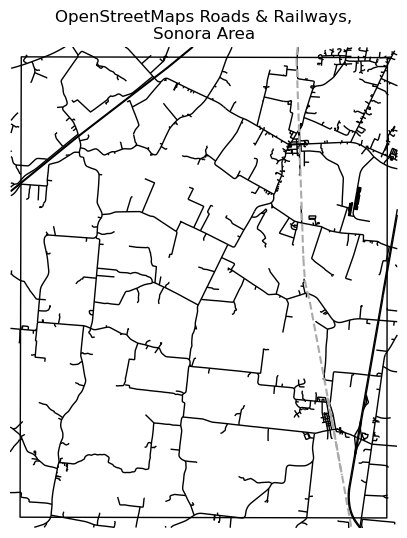

In [28]:
########################################
# Visualize OSM Road & Railway GeoJSONs
########################################

# path to roads GeoJSON
road_path = f"{output_dir}/osmroads.geojson"

# path to railways GeoJSON
rail_path = f"{output_dir}/osmrailways.geojson"

# path to target dataset boundary
boundary_path = f"{output_dir}/boundary.geojson"


##### plot GeoJSONs
fig, ax = plt.subplots(figsize=(5,7))

# roads...
gdf_roads = gpd.read_file(road_path)
gdf_roads.plot(ax=ax, edgecolor='k', linewidth=1, label='Roads')
bounds = gdf_roads.total_bounds

# railways...
gdf_rails = gpd.read_file(rail_path)
gdf_rails.plot(ax=ax, edgecolor='darkgray', linewidth=1.5, linestyle='--', label='Railways')

# dataset boundary...
gdf_boundary = gpd.read_file(boundary_path)
gdf_boundary.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=1)

ax.set_axis_off()
ax.set_xlim(bounds[0], bounds[2])
ax.set_ylim(bounds[1], bounds[3])
ax.set_title(f"OpenStreetMaps Roads & Railways,\n{area_name_formal} Area")

plt.show()


In [29]:
######################################################
# Combine OSM Roads & Railways Into Single GeoTIFF
######################################################

# list of paths to flowline and waterbody GeoJSONs
# NOTE: in this order, railways will be prioritized if features overlap
input_paths = [f"{output_dir}/osmroads.geojson", 
               f"{output_dir}/osmrailways.geojson"]

# path to reference image (using labeled target dataset)
reference_path = f"{output_dir}/mask.tif"

# path for output GeoTIFF
osm_path = f"{output_dir}/osm.tif"


##### rasterize each GeoJSON, align to target grid, combine images to single GeoTIFF
temp_paths = []
for path in input_paths:
    tmp_path = path.replace('.geojson', '.tif')
    temp_paths.append(tmp_path)
    gis_to_image(path, tmp_path, 5, multiclass_col=None)
    image_to_reference_grid(tmp_path, reference_path, output_dtype=np.float32)

combine_aligned_images(temp_paths, osm_path, mode="binary", class_values=None)

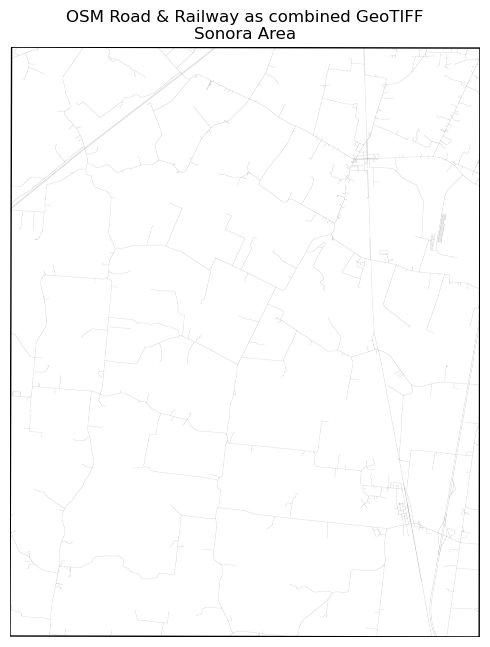

In [30]:
###########################
# Visualize Single GeoTIFF
###########################

# path to single GeoTIFF
nhd_path = f"{output_dir}/osm.tif"

# path to dataset boundary GeoJSON
boundary_path = f"{output_dir}/boundary.geojson"


##### plot GeoTIFF and AOI boundary
fig, ax = plt.subplots(figsize=(5,7))

# combined nhd geotiff...
with rasterio.open(nhd_path) as src:
    show(src, ax=ax, cmap='viridis', zorder=2)

# dataset boundary...
boundary = gpd.read_file(boundary_path)
boundary.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=1, zorder=1)

ax.set_axis_off()
ax.set_title(f"OSM Road & Railway as combined GeoTIFF\n{area_name_formal} Area")
plt.tight_layout()
plt.show()

In [31]:
#########################
# Delete OSM Data Folder
#########################

# nhd output directory path
osm_dir = f"{output_dir}/osm"


##### remove nhdplushr folder and all contents (to save disk space)
if os.path.isdir(osm_dir):
    shutil.rmtree(osm_dir)


##### delete single feature binary GeoTIFF files
rd_path = f"{output_dir}/osmroads.tif"
if os.path.isfile(rd_path):
    os.remove(rd_path)

rr_path = f"{output_dir}/osmrailways.tif"
if os.path.isfile(rr_path):
    os.remove(rr_path)


# **Multiscale Terrain Features**

***OVERVIEW***
* Terrain features are derived from the DEM to characterize the topography and capture features that are critical for identifying and delineating surficial geologic map units. These features provide supplementary data about topography, weathering processes, water drainage patterns, and vegetation that enhance the interpretation of geologic processes and landforms, contributing to more accurate predictions.

* Terrain features may be calculated using a variety of GIS tools. The features below use the Python implementation of Whitebox Tools. Details from the user manual are presented below each tool, and the reader is referred to the home page for more information - https://www.whiteboxgeo.com/manual/wbt_book/preface.html

***PURPOSE***
* Five terrain features are calculated from the DEM, each providing unique insights into the landscape's characteristics:

    1. **Slope.** Measures the steepness or incline of the terrain. It is critical for identifying areas prone to erosion, landslides, or specific deposition patterns associated with certain geologic map units.

    2. **Profile Curvature.** Indicates the curvature of the terrain in the direction of the slope. It affects the acceleration or deceleration of water flow, which can influence erosion and sediment deposition patterns.

    3. **Planform Curvature.** Measures the curvature perpendicular to the slope direction. It helps in identifying convergent and divergent flow patterns, which are important for understanding water drainage and sediment deposition.

    4. **Standard Deviation of Slope.** Provides a measure of the variability in slope within a given area. It is useful for identifying areas with complex topography, which may correlate with different geologic processes or materials.

    5. **Elevation Percentile.** Elevation percentile (EP) is a measure of local topographic position. It is useful for identifying areas of high or low relative topographic position such as ridges, valleys, or sinkholes.

* Each terrain feature described above will be calculated at multiple scales to capture local, intermediate, and global scales. This will be accomplished by first resampling the DEM to multiple coarser resolutions, and then calculating each terrain features at each of these resolutions. It is well established that landforms and geologic processes operate at multiple scales. For example, a high resolution slope image will identify areas of abrupt local change in elevation like the edges of a small stream or building foundation, whereas slope calculated at a coarser resolution could highlight areas within a larger flat plain or hill side. 

In [32]:
#########################
# Initialize Whitebox
#########################
# USER MANUAL: https://whiteboxgeo.com/manual/wbt_book/preface.html

# import whitebox tools class as wbt object
wbt = whitebox.WhiteboxTools()

# toggle on/off geoprocessing tool outputs (optional)
wbt.verbose = False

# set working directory for input/output files to current working directory
wbt.set_working_dir(os.getcwd())

# print whitebox version to verify correctly loading
wbt.version()

"WhiteboxTools v2.4.0 (c) Dr. John Lindsay 2017-2023\n\nWhiteboxTools is an advanced geospatial data analysis platform developed at\nthe University of Guelph's Geomorphometry and Hydrogeomatics Research \nGroup (GHRG). See www.whiteboxgeo.com for more details.\n"

## *Multidirectional Hillshade*

The purpose of the multi-directional hillshade image created below his is strictly to enhance visualizations.

This tool performs a hillshade operation (also called shaded relief) on an input digital elevation model (DEM) with multiple sources of illumination. The user must specify the name of the input DEM (--dem) and the output hillshade image name (--output). Other parameters that must be specified include the altitude of the illumination sources (--altitude; i.e. the elevation of the sun above the horizon, measured as an angle from 0 to 90 degrees) and the Z conversion factor (--zfactor). The Z conversion factor is only important when the vertical and horizontal units are not the same in the DEM, and the DEM is in a projected coordinate system.

The hillshade value (HS) of a DEM grid cell is calculate as, HS = tan(s) / [1 - tan(s)2]0.5 x [sin(Alt) / tan(s) - cos(Alt) x sin(Az - a)], where s and a are the local slope gradient and aspect (orientation) respectively and Alt and Az are the illumination source altitude and azimuth respectively. Slope and aspect are calculated using Horn's (1981) 3rd-order finate difference method.

Lastly, the user must specify whether or not to use full 360-degrees of illumination sources (--full_mode). When this flag is not specified, the tool will perform a weighted summation of the hillshade images from four illumination azimuth positions at 225, 270, 315, and 360 (0) degrees, given weights of 0.1, 0.4, 0.4, and 0.1 respectively. When run in the full 360-degree mode, eight illumination source azimuths are used to calculate the output at 0, 45, 90, 135, 180, 225, 270, and 315 degrees, with weights of 0.15, 0.125, 0.1, 0.05, 0.1, 0.125, 0.15, and 0.2 respectively.

* https://www.whiteboxgeo.com/manual/wbt_book/available_tools/geomorphometric_analysis.html#MultidirectionalHillshade

In [33]:
########################################
# Calculate Multi-directional Hillshade
########################################

# path to DEM
dem_path = f"{output_dir}/dem.tif"
dem_path = os.path.abspath(dem_path)

# path for output GeoTIFF
mdhs_path = f"{output_dir}/mdhs.tif"
mdhs_path = os.path.abspath(mdhs_path)


##### calculate mdhs
wbt.multidirectional_hillshade(dem_path, mdhs_path, altitude=30, zfactor=None, full_mode=False)

0

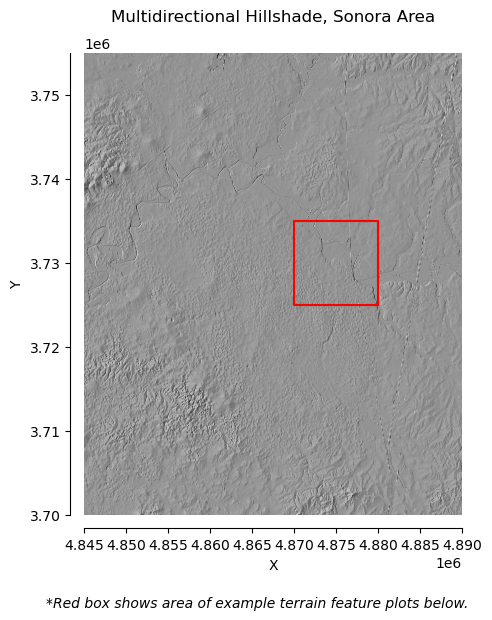

In [34]:
#################
# Visualize MDHS
#################

# path to mdhs image
mdhs_path = f"{output_dir}/mdhs.tif"


##### plot mdhs image
fig, ax = plt.subplots(figsize=(8,6))

# plot multidirectional hillshade
with rasterio.open(mdhs_path) as src:
    crs = src.crs
    show(src, ax=ax, cmap='binary_r')

# plot inset figure box & text description
x, y = box(*bounding_box).exterior.xy
inset = ax.plot(x, y, 'r-')
ax.text(x=-0.1, y=-0.2, s='*Red box shows area of example terrain feature plots below.', style='italic', transform=ax.transAxes)

# customize plot
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_position(('outward', 10))
ax.spines['left'].set_position(('outward', 10))
ax.set_title(f"Multidirectional Hillshade, {area_name_formal} Area", y=1.05)

plt.show()

## *Digital Elevation Model*

Multiple scales of terrain features can be critical to accurately detect and characterize surficial geologic map units. The original DEM will then be downsampled to several lower resolutions to capture local, intermediate, and global scale topographic features that may be relevant to the ultimate goal of identifying surficial geologic map units.

* Original DEM has a spatial resolution of 5x5 feet per pixel.

* DEM will be downsampled to resolutions of 10x10, 20x20, 50x50, 100x100, and 200x200 feet per pixel.

* Terrain features will be calculated for each DEM resolution.

In [35]:
################################
# Create Multiple Scales of DEM
################################

# path to original dem
dem_path = f"{output_dir}/dem.tif"


##### downsample DEM and save new GeoTIFF images
# iterate through resolutions, downsample DEM, and save as GeoTIFF
for res in downsample_resolutions:

    # create output path
    output_path = f"{output_dir}/dem_{res}.tif"

    if not os.path.isfile(output_path):

        # resample dem to given resolution
        resample_image(dem_path, res, output_path)

        # apply gaussian filter to downsampled DEM
        filter_image(input_path=output_path, sigma=sigma)

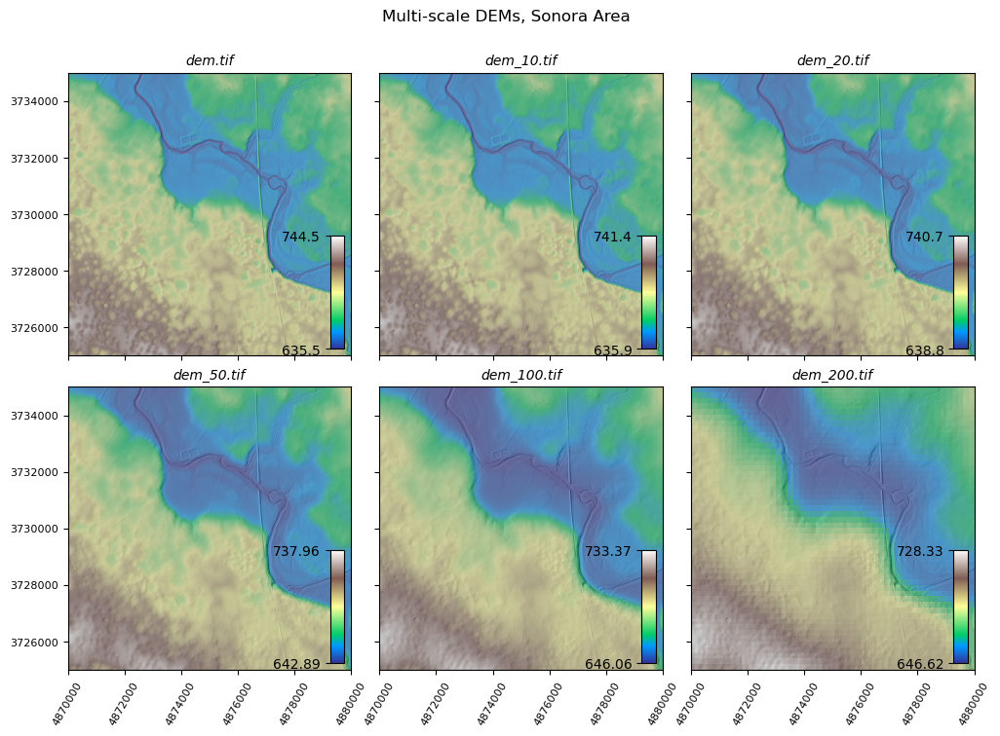

In [37]:
#############################
# Visualize Downsampled DEMs
#############################

# list of paths to DEMs...
dem_paths = glob.glob(f"{output_dir}/dem*.tif")
dem_paths.sort(key=lambda x: list(map(int, re.findall(r'\d+', x))))   # sort DEMs in order of resolution

# path to multi-directional hillshade (used as base layer to aid visualization)
mdhs_path = f"{output_dir}/mdhs.tif"

# colormap for terrain feature
cmap = 'terrain'

# title for plot
title = f"Multi-scale DEMs, {area_name_formal} Area\n"


##### plot DEMs
plot_multi_terrain_features(mdhs_path, dem_paths, bounding_box, cmap, title)

## *Slope*

This tool calculates slope gradient (i.e. slope steepness in degrees, radians, or percent) for each grid cell in an input digital elevation model (DEM). For DEMs in projected coordinate systems, the tool uses the 3rd-order bivariate Taylor polynomial method described by Florinsky (2016). Based on a polynomial fit of the elevations within the 5x5 neighbourhood surrounding each cell, this method is considered more robust against outlier elevations (noise) than other methods.

* https://www.whiteboxgeo.com/manual/wbt_book/available_tools/geomorphometric_analysis.html#Slope

In [38]:
###################
# Calculate Slopes
###################

# paths to DEMs
dem_paths = glob.glob(f"{output_dir}/dem*.tif")

# path to target image (for reference)
reference_path = f"{output_dir}/mask.tif"


##### calculate slope
for dem in dem_paths:

    # create output path
    output_path = dem.replace('dem', 's')

    # create absolute paths (Whitebox does not like relative paths)
    dem = os.path.abspath(dem)
    output_path = os.path.abspath(output_path)

    # calculate slope (default 5x5 pixel window)
    wbt.slope(dem=dem, output=output_path)

    # upsample & align to target image
    image_to_reference_grid(input_path=output_path, reference_path=reference_path)

    # apply gaussian filter to upsampled image
    filter_image(input_path=output_path, sigma=sigma)

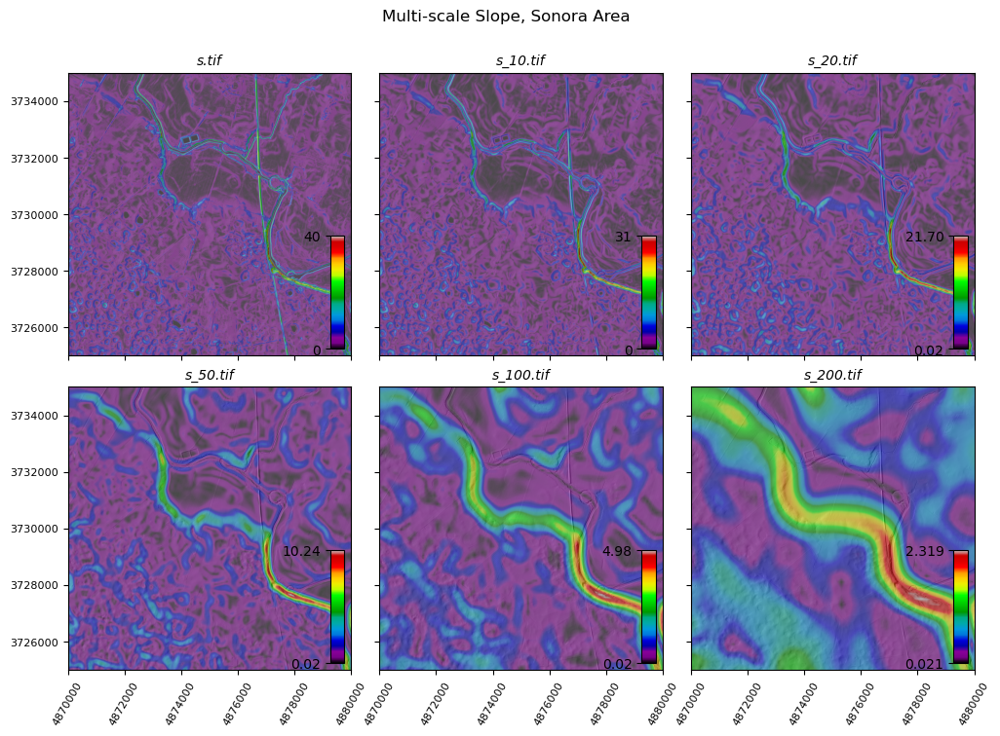

In [39]:
#####################################
# Visualize Downsampled Slope Images
#####################################

# paths to slope images
slope_paths = glob.glob(f"{output_dir}/s*.tif")
slope_paths.sort(key=lambda x: list(map(int, re.findall(r'\d+', x))))

# path to multi-directional hillshade
mdhs_path = f"{output_dir}/mdhs.tif"

# colormap for terrain feature
cmap = 'nipy_spectral'

# title for plot
title = f"Multi-scale Slope, {area_name_formal} Area"


##### plot slope images
plot_multi_terrain_features(mdhs_path, slope_paths, bounding_box, cmap, title)

## *Profile Curvature*

This tool calculates the profile (or vertical) curvature, or the rate of change in slope along a flow line, from a digital elevation model (DEM). It is the curvature of a normal section having a common tangent line with a slope line at a given point on the surface (Florinsky, 2017). This variable has an unbounded range that can take either positive or negative values. Positive values of the index are indicative of flow acceleration while negative profile curvature values indicate flow deceleration. Profile curvature is measured in units of m-1. For DEMs in projected coordinate systems, the tool uses the 3rd-order bivariate Taylor polynomial method described by Florinsky (2016). Based on a polynomial fit of the elevations within the 5x5 neighbourhood surrounding each cell, this method is considered more robust against outlier elevations (noise) than other methods.

* https://www.whiteboxgeo.com/manual/wbt_book/available_tools/geomorphometric_analysis.html#ProfileCurvature

In [40]:
###############################
# Calculate Profile Curvatures
###############################

# paths to DEMs
dem_paths = glob.glob(f"{output_dir}/dem*.tif")

# path to target image (for reference)
reference_path = f"{output_dir}/mask.tif"


##### calculate log profile curvature
for dem in dem_paths:

    # create output path
    output_path = dem.replace('dem', 'prc')

    # create absolute paths - Whitebox does not like relative paths
    dem = os.path.abspath(dem)
    output_path = os.path.abspath(output_path)

    # calculate log of profile curvature (default 5x5 pixel window)
    wbt.profile_curvature(dem=dem, output=output_path, log=True)

    # upsample & align to target image
    image_to_reference_grid(input_path=output_path, reference_path=reference_path)

    # apply gaussian filter to upsampled image
    filter_image(input_path=output_path, sigma=sigma)

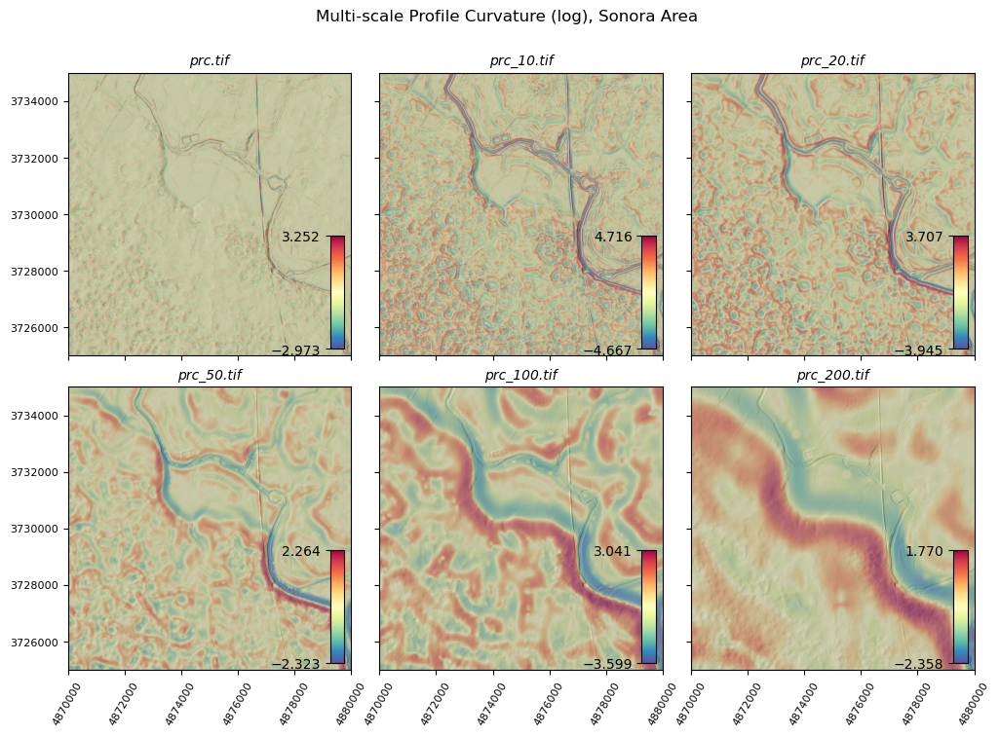

In [41]:
#################################################
# Visualize Downsampled Profile Curvature Images
#################################################

# paths to profile curvature images
procurv_paths = glob.glob(f"{output_dir}/prc*.tif")
procurv_paths.sort(key=lambda x: list(map(int, re.findall(r'\d+', x))))

# path to multi-directional hillshade
mdhs_path = f"{output_dir}/mdhs.tif"

# colormap for terrain feature
cmap = 'Spectral_r'

# title for plot
title = f"Multi-scale Profile Curvature (log), {area_name_formal} Area"


##### plot profile curvature images
plot_multi_terrain_features(mdhs_path, procurv_paths, bounding_box, cmap, title)

## *Planform Curvature*

This tool calculates the plan (or contour) curvature from a digital elevation model (DEM). Plan curvature is the curvature of a contour line at a given point on the topographic surface (Florinsky, 2017). This variable has an unbounded range that can take either positive or negative values. Positive values of the index are indicative of flow divergence while negative plan curvature values indicate flow convergence. Thus plan curvature is similar to tangential curvature, although the literature suggests that the latter is more numerically stable (Wilson, 2018). Plan curvature is measured in units of m-1. method described by Florinsky (2016). Based on a polynomial fit of the elevations within the 5x5 neighbourhood surrounding each cell, this method is considered more robust against outlier elevations (noise) than other methods. 

* https://www.whiteboxgeo.com/manual/wbt_book/available_tools/geomorphometric_analysis.html#PlanCurvature

In [42]:
################################
# Calculate Planform Curvatures
################################

# paths to DEMs
dem_paths = glob.glob(f"{output_dir}/dem*.tif")

# path to target image (for reference)
reference_path = f"{output_dir}/mask.tif"


##### calculate log planform curvature
for dem in dem_paths:

    # create output path
    output_path = dem.replace('dem', 'plc')

    # create absolute paths - Whitebox does not like relative paths
    dem = os.path.abspath(dem)
    output_path = os.path.abspath(output_path)

    # calculate log of planform curvature (default 5x5 pixel window)
    wbt.plan_curvature(dem=dem, output=output_path, log=True)

    # upsample & align to target image
    image_to_reference_grid(input_path=output_path, reference_path=reference_path)

    # apply gaussian filter to upsampled image
    filter_image(input_path=output_path, sigma=sigma)

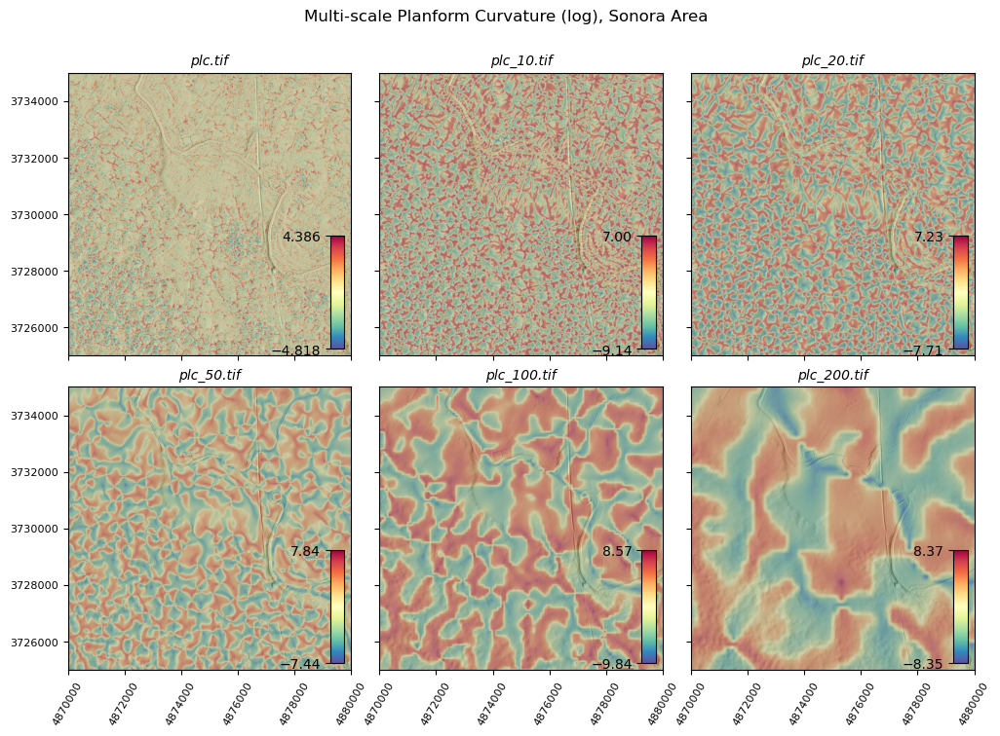

In [43]:
#################################################
# Visualize Downsampled Planform Curvature Images
#################################################

# paths to planform curvature images
plancurv_paths = glob.glob(f"{output_dir}/plc*.tif")
plancurv_paths.sort(key=lambda x: list(map(int, re.findall(r'\d+', x))))

# path to multi-directional hillshade
mdhs_path = f"{output_dir}/mdhs.tif"

# colormap for terrain feature
cmap = 'Spectral_r'

# title for plot
title = f"Multi-scale Planform Curvature (log), {area_name_formal} Area"


##### plot profile curvature images
plot_multi_terrain_features(mdhs_path, plancurv_paths, bounding_box, cmap, title)

## *Standard Deviation of Slope*

Calculates the standard deviation of slope from an input DEM, a metric of roughness described by Grohmann et al., (2011). 

This feature is calculated with various sized window kernels and the original DEM (5 foot resolution); kernels represent approximately same area as the re-sampled terrain features calculated above.

* https://www.whiteboxgeo.com/manual/wbt_book/available_tools/geomorphometric_analysis.html#StandardDeviationOfSlope



In [44]:
##############################################################
# Calculate Standard Deviation of Slope from Downsampled DEMs
##############################################################

# path to DEM
dem_path = f"{output_dir}/dem.tif"

# path to target image (for reference)
reference_path = f"{output_dir}/mask.tif"


##### calculate standard deviation of slope using multiple kernel sizes
for kernel in kernel_windows:

    # define output path
    output_path = f"{output_dir}/sds_{kernel}x{kernel}.tif"

    # convert all paths to absolute for Whitebox
    dem = os.path.abspath(dem_path)
    output_path = os.path.abspath(output_path)

    # calculate SDS
    wbt.standard_deviation_of_slope(dem, output_path, zfactor=None, filterx=kernel, filtery=kernel)

    image_to_reference_grid(input_path=output_path, reference_path=reference_path)

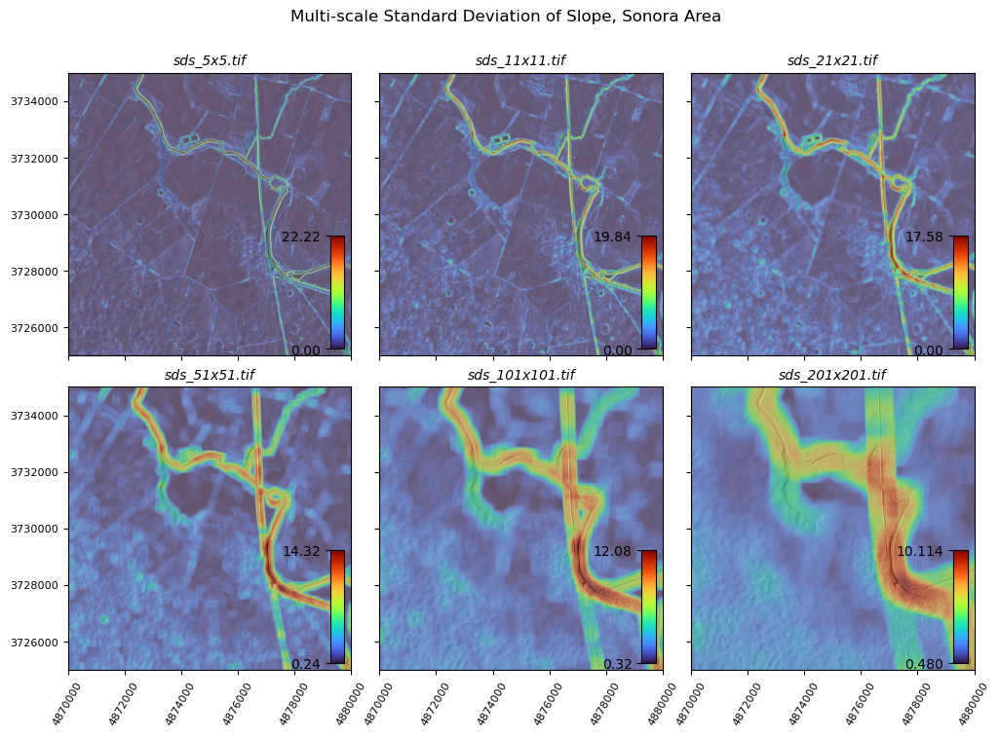

In [45]:
###########################################################
# Visualize Downsampled Standard Deviation of Slope Images
###########################################################

# paths to standard deviation of slope images
stdslope_paths = glob.glob(f"{output_dir}/sds*.tif")
stdslope_paths.sort(key=lambda x: list(map(int, re.findall(r'\d+', x))))

# path to multi-directional hillshade
mdhs_path = f"{output_dir}/mdhs.tif"

# colormap for terrain feature
cmap = 'turbo'

# title for plot
title = f"Multi-scale Standard Deviation of Slope, {area_name_formal} Area"


##### plot profile curvature images
plot_multi_terrain_features(mdhs_path, stdslope_paths, bounding_box, cmap, title)

## *Elevation Percentile*

Elevation percentile (EP) is a measure of local topographic position (LTP). It expresses the vertical position for a DEM grid cell ($z_0$) as the percentile of the elevation distribution within the filter window, such that:

$EP = count_{i \epsilon C}(z_i < z_0) \times (100 / n_C)$

where $z_0$ is the elevation of the window's center grid cell, $z_i$ is the elevation of cell $i$ contained within the window set $C$, and $n_C$ is the number of grid cells contained within the window.

EP is unsigned and expressed as a percentage, bound between 0% and 100%. Quantile-based estimates (e.g., the median and interquartile range) are often used in nonparametric statistics to provide data variability estimates without assuming the distribution is normal. Thus, EP is largely unaffected by irregularly shaped elevation frequency distributions or by outliers in the DEM, resulting in a highly robust metric of LTP. In fact, elevation distributions within small to medium sized neighborhoods often exhibit skewed, multimodal, and non-Gaussian distributions, where the occurrence of elevation errors can often result in distribution outliers. Thus, based on these statistical characteristics, EP is considered one of the most robust representation of LTP.

This feature is calculated with various sized window kernels and the original DEM (5 foot resolution); kernels represent approximately same area as the re-sampled terrain features calculated above.


* https://www.whiteboxgeo.com/manual/wbt_book/available_tools/geomorphometric_analysis.html#ElevPercentile

In [46]:
#################################################################
# Calculate Elevation Percentile from DEM & Adjustable Windows
#################################################################

# paths to DEMs
dem_path = f"{output_dir}/dem.tif"

# path to target image (for reference)
reference_path = f"{output_dir}/mask.tif"


##### calculate standard deviation of slope using various windows
for kernel in kernel_windows:

    # define output path
    output_path = f"{output_dir}/ep_{kernel}x{kernel}.tif"

    # convert paths to absolute
    dem = os.path.abspath(dem_path)
    output_path = os.path.abspath(output_path)

    # calculate elevation percentile
    wbt.elev_percentile(dem=dem, output=output_path, filterx=kernel, filtery=kernel)
    
    # reproject to reference grid
    image_to_reference_grid(input_path=output_path, reference_path=reference_path)

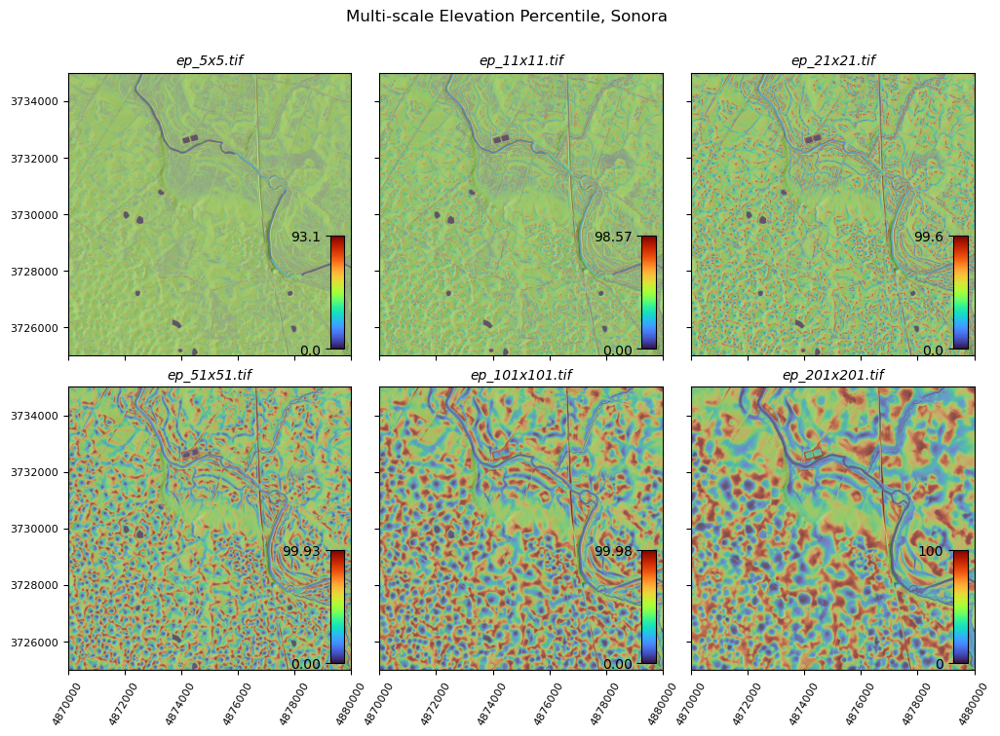

In [47]:
####################################################
# Visualize Downsampled Elevation Percentile Images
####################################################

# paths to elevation percentile images
ep_paths = glob.glob(f"{output_dir}/ep*.tif")
ep_paths.sort(key=lambda x: list(map(int, re.findall(r'\d+', x))))

# path to multi-directional hillshade
mdhs_path = f"{output_dir}/mdhs.tif"

# colormap for terrain feature
cmap = 'turbo'

# title for plot
title = f"Multi-scale Elevation Percentile, {area_name_formal}"


##### plot profile curvature images
plot_multi_terrain_features(mdhs_path, ep_paths, bounding_box, cmap, title)

## *Delete Unecessary Images*

In [48]:
######################################
# Delete Downsampled DEMs & Hillshade
######################################

# paths to downsampled DEMs
dem_paths = glob.glob(f"{output_dir}/dem_*.tif")

# path to hillshade image
hs_path = f"{output_dir}/mdhs.tif"


##### delete files
for path in dem_paths:
    if os.path.isfile(path):
        os.remove(path)

if os.path.isfile(hs_path):
    os.remove(hs_path)

# **Image Alignment**

## *Check Image Alignments*

In [49]:
########################
# Check Image Alignment
########################
# NOTE: DEM was created from merging multiple tiles and has not been reprojected to target grid. All other images should be aligned at this point.

# paths to images
image_paths = glob.glob(f"{output_dir}/*.tif")
image_paths.sort(key=lambda x: x.lower())


##### check image alignment
df = check_image_alignment(image_paths, target='mask')
df.head(len(df))

,image,path,dtype,nodata,aligned,res_x,res_y,width,height,left,bottom,right,top
0,aerialb,../data/sonora/aerialb.tif,float32,NaN,True,5.00,5.00,7265,9118,4848728.04,3705655.83,4885053.04,3751245.83
1,aerialg,../data/sonora/aerialg.tif,float32,NaN,True,5.00,5.00,7265,9118,4848728.04,3705655.83,4885053.04,3751245.83
2,aerialnir,../data/sonora/aerialnir.tif,float32,NaN,True,5.00,5.00,7265,9118,4848728.04,3705655.83,4885053.04,3751245.83
3,aerialr,../data/sonora/aerialr.tif,float32,NaN,True,5.00,5.00,7265,9118,4848728.04,3705655.83,4885053.04,3751245.83
4,dem,../data/sonora/dem.tif,float32,-340282306073709652508363335590014353408.00,False,5.00,5.00,9000,11000,4845000.00,3700000.00,4890000.00,3755000.00
5,ep_101x101,../data/sonora/ep_101x101.tif,float32,NaN,True,5.00,5.00,7265,9118,4848728.04,3705655.83,4885053.04,3751245.83
6,ep_11x11,../data/sonora/ep_11x11.tif,float32,NaN,True,5.00,5.00,7265,9118,4848728.04,3705655.83,4885053.04,3751245.83
7,ep_201x201,../data/sonora/ep_201x201.tif,float32,NaN,True,5.00,5.00,7265,9118,4848728.04,3705655.83,4885053.04,3751245.83
8,ep_21x21,../data/sonora/ep_21x21.tif,float32,NaN,True,5.00,5.00,7265,9118,4848728.04,3705655.83,4885053.04,3751245.83
9,ep_51x51,../data/sonora/ep_51x51.tif,float32,NaN,True,5.00,5.00,7265,9118,4848728.04,3705655.83,4885053.04,3751245.83


## *Align Images*

In [50]:
#################################
# Align Images with Target Image
#################################

# paths to images that need clipped (should only be original DEM)
# NOTE: Downsampled DEMs and mdhs will not be used for modeling, so will not be aligned here.
align_paths = df.loc[df['aligned'] == False, 'path'].to_list()

# path to reference target image to align input
reference_path = f"{output_dir}/mask.tif"


##### register and align input images with labeled target dataset
for path in align_paths:
    image_to_reference_grid(path, reference_path)

## *Verify Image Alignments*

In [51]:
###########################
# Re-Check Image Alignment
###########################
# NOTE: all images should be aligned now. also, dtypes & nodata values should all be float32 & NAN

# paths to images
image_paths = glob.glob(f"{output_dir}/*.tif")
image_paths.sort(key=lambda x: x.lower())


##### check image alignment
df = check_image_alignment(image_paths, target='mask')
df.head(len(df))

,image,path,dtype,nodata,aligned,res_x,res_y,width,height,left,bottom,right,top
0,aerialb,../data/sonora/aerialb.tif,float32,NaN,True,5.00,5.00,7265,9118,4848728.04,3705655.83,4885053.04,3751245.83
1,aerialg,../data/sonora/aerialg.tif,float32,NaN,True,5.00,5.00,7265,9118,4848728.04,3705655.83,4885053.04,3751245.83
2,aerialnir,../data/sonora/aerialnir.tif,float32,NaN,True,5.00,5.00,7265,9118,4848728.04,3705655.83,4885053.04,3751245.83
3,aerialr,../data/sonora/aerialr.tif,float32,NaN,True,5.00,5.00,7265,9118,4848728.04,3705655.83,4885053.04,3751245.83
4,dem,../data/sonora/dem.tif,float32,NaN,True,5.00,5.00,7265,9118,4848728.04,3705655.83,4885053.04,3751245.83
5,ep_101x101,../data/sonora/ep_101x101.tif,float32,NaN,True,5.00,5.00,7265,9118,4848728.04,3705655.83,4885053.04,3751245.83
6,ep_11x11,../data/sonora/ep_11x11.tif,float32,NaN,True,5.00,5.00,7265,9118,4848728.04,3705655.83,4885053.04,3751245.83
7,ep_201x201,../data/sonora/ep_201x201.tif,float32,NaN,True,5.00,5.00,7265,9118,4848728.04,3705655.83,4885053.04,3751245.83
8,ep_21x21,../data/sonora/ep_21x21.tif,float32,NaN,True,5.00,5.00,7265,9118,4848728.04,3705655.83,4885053.04,3751245.83
9,ep_51x51,../data/sonora/ep_51x51.tif,float32,NaN,True,5.00,5.00,7265,9118,4848728.04,3705655.83,4885053.04,3751245.83


# **Image Patches**

## *Create Patches*

In [52]:
##############################
# Create GIS Patch Polygons
##############################

# path to reference image
reference_path = f"{output_dir}/mask.tif"

# path to AOI dataset boundary (not buffered boundary)
boundary_path = f"{output_dir}/boundary.geojson"

# output path of patches GeoJSON
output_path = f"{output_dir}/{area_name_abbr}_patches.geojson"


##### create patches geodataframe
create_image_patches(reference_path, patch_size, overlap, boundary_path, output_path, area_name_abbr)

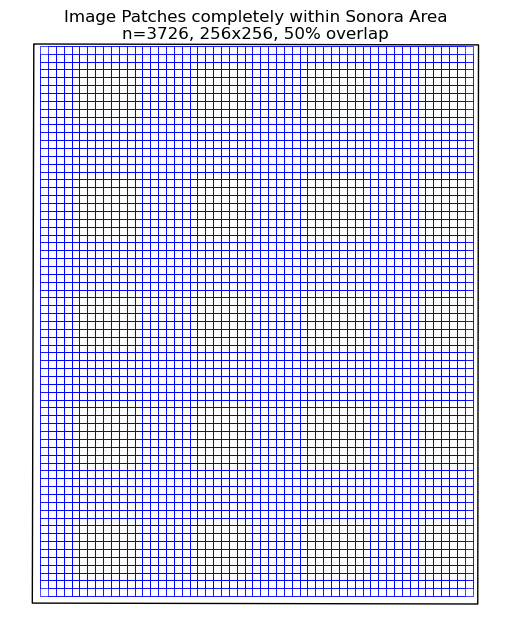

In [53]:
####################
# Visualize patches
####################

# path to patches geojson
patches_path = glob.glob(f"{output_dir}/*patches.geojson")[0]

# path to boundary (non-buffered)
boundary_path = f"{output_dir}/boundary.geojson"


##### plot patches overlying target area
# read patches and boundary GeoJSONs
patches = gpd.read_file(patches_path)
boundary = gpd.read_file(boundary_path)

# plot figure
fig, ax = plt.subplots(figsize=(12,8))
boundary.plot(ax=ax, facecolor='none', edgecolor='k')
patches.plot(ax=ax, edgecolor='blue', facecolor='none', linewidth=0.5)
ax.set_axis_off()

# get patch data for title
ax.set_title(f"Image Patches completely within {area_name_formal} Area\nn={len(patches)}, {patch_size}x{patch_size}, {int(overlap*100)}% overlap", y=0.95)
plt.show()


## *Encode Patch Features*

In [54]:
#############################################################
# Get Labels and Proportions of Map Unit Areas in Each Patch
#############################################################

# path to patches GeoJSON
patches_path = glob.glob(f"{output_dir}/*patches.geojson")[0]

# path to geology GeoJSON
mask_path = f"{output_dir}/mask.geojson"

# label space
label_space = list(SG_MAPPING.keys())


##### calculate & save class-area proportions per patch...
df_areas = calculate_patch_areas(patches_path, mask_path, label_space)
areas_path = f"{output_dir}/{area_name_abbr}_areas.csv"
df_areas.to_csv(areas_path, index=False)


##### calculate & save one-hot labels for each patch...
df_labels = calculate_one_hots(areas_path, threshold=None)
labels_path = f"{output_dir}/{area_name_abbr}_labels.csv"
df_labels.to_csv(labels_path, index=False)


## *Extract Patches*

In [55]:
###########################
# Extract GeoTIFF Patches
###########################

# list of paths to images
image_paths = glob.glob(f"{output_dir}/*.tif")
image_paths.sort(key=lambda x: x.lower())

# path to patch polygons
patches_path = glob.glob(f"{output_dir}/*patches.geojson")[0]

# path to patch labels
label_path = glob.glob(f"{output_dir}/*labels.csv")[0]

# directory path for patches
patches_dir = f"{output_dir}/patches"
if not os.path.isdir(patches_dir):
    os.makedirs(patches_dir)


##### extract selected patches...
patches = gpd.read_file(patches_path)
for path in image_paths:
    window = os.path.basename(path)
    extract_patch(path, patches, patches_dir)


##### save one-hot label for each patch...
labels = pd.read_csv(label_path)
for _, row in labels.iterrows():
    patch_name = row['patch_id']
    data = row.iloc[1:]
    data.to_csv(f"{patches_dir}/{patch_name}_labels.csv", header=False, index=False)

## *Validate Patches*

In [56]:
#################################
# Validate Patches & Plot if Any
#################################

# paths of patches
patches_paths = glob.glob(f"{output_dir}/patches/*.tif")


##### iterate through each patch and check height and width and nodata values...
bad_patches = [] 
for path in patches_paths: 
    bad = validate_patches(path, patch_size)
    if bad is None:
        continue
    if any(x in bad for x in ('nhd', 'osm')):
        continue
    bad_patches.append(bad)


########## plot incorrectly sized patches (if any)
if len(bad_patches) > 0:
    fig, ax = plt.subplots(figsize=(10,6))
    boundary = gpd.read_file(f"{output_dir}/boundary.geojson")
    for path in bad_patches:
        with rasterio.open(path) as src:
            data = src.read(1)
            binary_mask = np.where(data>0, 1, 0)
            show(binary_mask, transform=src.transform, ax=ax, cmap='gray')
    boundary.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=0.5)
    ax.set_axis_off()
    ax.set_title(f"Incorrectly Sized Patches, {area_name_formal} Area\nn={len(bad_patches)}")
    plt.tight_layout()
    plt.show()
else:
    print('No incorrectly sized patches...')

No incorrectly sized patches...


## *Get Image Stats*

In [57]:
#############################################################
# Get Mean & Standard Deviations of Images for Normalization
#############################################################

# patch IDs for area
patch_path = glob.glob(f"{output_dir}/*_patches.geojson")[0]
patch_ids = gpd.read_file(patch_path)['patch_id'].to_list()


##### calculate mean and standard deviation for each image...
df_stats = calculate_dataset_stats(data_dir=f"{output_dir}/patches", patch_ids=None)
output_path = f"{output_dir}/{area_name_abbr}_stats.csv"
df_stats.to_csv(output_path, index=True)


## *Visualize Patch*

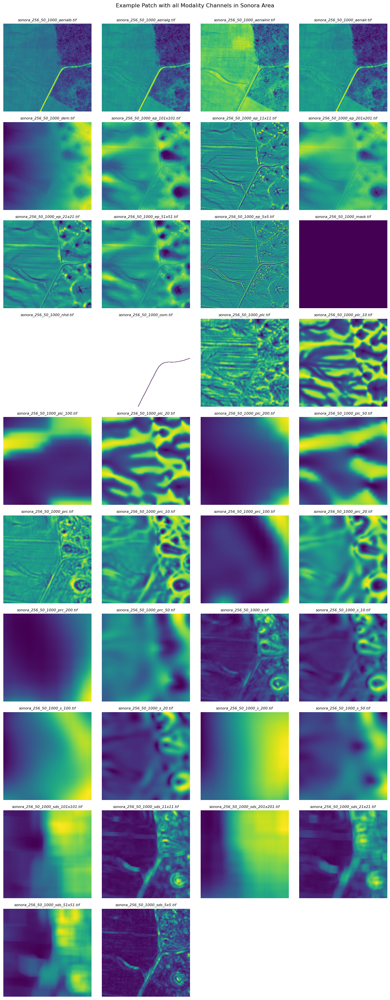

In [58]:
#########################
# Visualize Random Patch
#########################

# paths to cleaned & size-verified patches
patch_paths = glob.glob(f"{output_dir}/patches/*.tif")
patch_paths.sort(key=lambda x: x.lower())    # sort by name to get paired patches
patch_paths = patch_paths[:38]

# figure parameters
nrows = 10
ncols = 4

##### plot first random patch
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,30))
fig.subplots_adjust(wspace=0.1)
ax = ax.ravel()

for idx, image in enumerate(patch_paths):
    with rasterio.open(image) as src:
        show(src, ax=ax[idx])
        ax[idx].set_axis_off()
        ax[idx].set_title(os.path.basename(image), style='italic', fontsize=8, y=1)

unused = (nrows * ncols) - len(patch_paths)
for x in ax[-unused:]:
    fig.delaxes(x)

plt.suptitle(f"Example Patch with all Modality Channels in {area_name_formal} Area", y=1)
plt.tight_layout()
plt.show()

# **Final File Cleanup**

In [59]:
#################################################################
# Delete all single GeoTIFF files & GeoJSONs (besides patches)
#################################################################

# delete GeoTIFF files...
tif_paths = glob.glob(f"{output_dir}/*.tif")
for path in tif_paths:
    if os.path.isfile(path):
        os.remove(path)

# paths to GeoJSONs to delete
geojson_paths = glob.glob(f"{output_dir}/*.geojson")
for path in geojson_paths:
    if os.path.isfile(path):
        if not 'patches' in path:
            os.remove(path)

# **Dataset Metadata**

In [4]:
###################################
# Create Dataset Metadata for AOI
###################################

# patches GeoJSON...
patches_path = f"{output_dir}/{area_name_abbr}_patches.geojson"    # path
gdf = gpd.read_file(patches_path)                                  # read as gdf

# list of paths to GeoTIFF images
tif_list = glob.glob(f"{output_dir}/patches/*.tif")

# extract image metadata (all images have same metadata)
with rasterio.open(tif_list[0]) as src:
    meta = src.meta


##### create dataset metadata & save as JSON
create_metadata(area_name=area_name_formal, num_patches=len(gdf), num_tifs=len(tif_list), img_meta=meta, patch_size=patch_size, overlap=overlap, output_path=f"{output_dir}/{area_name_abbr}_metadata.json")